In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.display import display, Image
import arviz
import pymc as pm
import numpy
import pandas
from matplotlib import pyplot
import ipywidgets

import dataloading
import models
import plotting

You are running the v4 development version of PyMC which currently still lacks key features. You probably want to use the stable v3 instead which you can either install via conda or find on the v3 GitHub branch: https://github.com/pymc-devs/pymc/tree/v3


### Fetch data and calibrations

In [3]:
design_cols = ["iptg", "glucose"]
df_layout = dataloading.get_layout(r"multibatch\FullWellDescription.xlsx", design_cols)
df_time, df_A360, df_A600 = dataloading.vectorize_observations(
    df_layout,
    observations={
         "Carboxylase_19": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_600nm.csv"),
         ),
         "Carboxylase_20": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_20_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_20_600nm.csv"),
         ),
        "Carboxylase_21": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_600nm.csv"),
         ),
    }
)

cm_600 = models.LinearBiomassAbsorbanceModel.load("calibration_A600_multibatch.json")

90 rows were dropped because a product concentration was unknown AND information in columns ['iptg', 'glucose'] was incomplete.


### Construct the full model

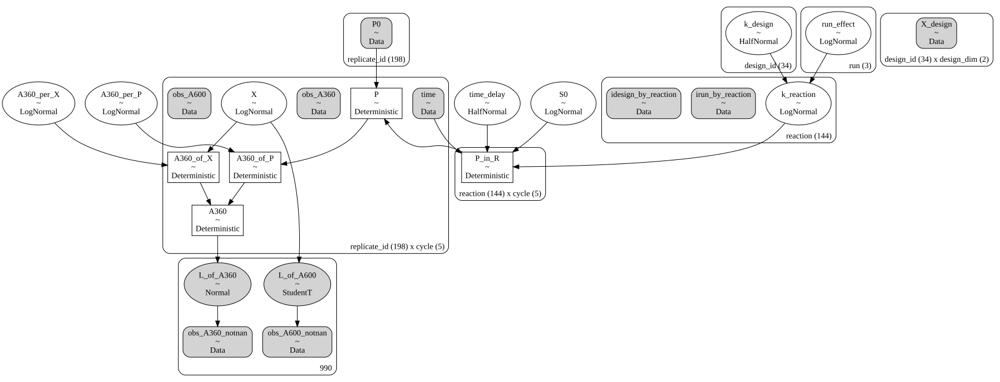

In [4]:
with pm.Model() as pmodel:
    pmodel = models.build_model(
        df_layout,    # for mapping reaction and assay wells
        df_time,
        df_A360,
        df_A600,
        cm_600,       # for learning about X from A600
        kind="mass action",
        design_cols=design_cols,
    )

# Optional: Plot the model in plate notation
display(pm.model_to_graphviz(pmodel))

### Hit the inference button!

In [5]:
with pmodel:
    idata = pm.sample()
idata

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [X, S0, time_delay, k_design, run_effect, k_reaction, A360_per_X, A360_per_P]


Sampling 3 chains for 1_000 tune and 1_000 draw iterations (3_000 + 3_000 draws total) took 150 seconds.


Inference data with groups:
	> posterior
	> log_likelihood
	> sample_stats
	> observed_data
	> constant_data

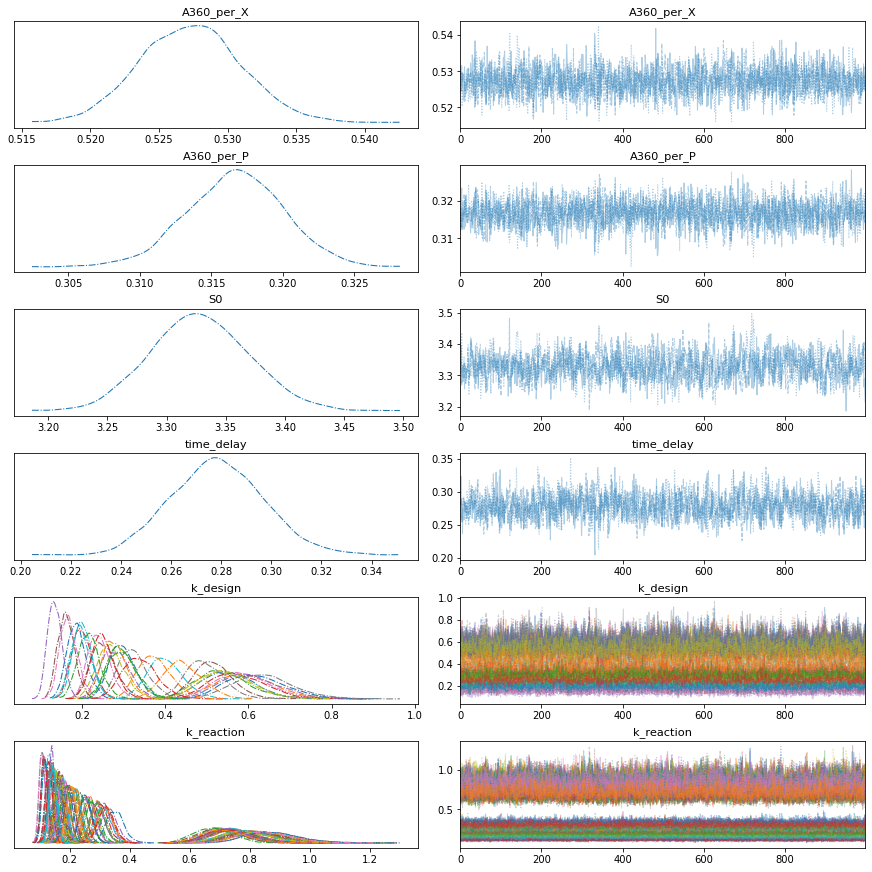

In [6]:
interesting_variables = [
    "A360_per_X",
    "A360_per_P",
    "S0",
    "time_delay",
    "k_design",
    "k_reaction",
]
arviz.plot_trace(idata, var_names=interesting_variables, combined=True);

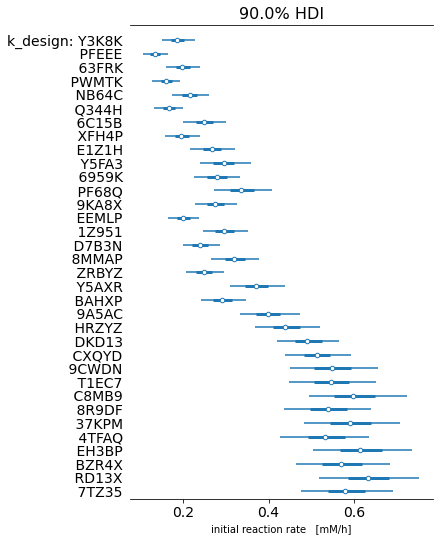

The plot shows the smallest interval in which the metric lies with a probability of 90.0 %.


In [7]:
ordered_designs = []
for d in df_layout[df_layout["product"].isna()].sort_values(design_cols[::-1]).design_id:
    if d not in ordered_designs:
        ordered_designs.append(d)

hdi_prob = 0.9
arviz.plot_forest(
    idata,
    var_names=["k_design"],
    combined=True,
    hdi_prob=hdi_prob,
    coords={
        "design_id": ordered_designs,
    }
)
pyplot.xlabel("initial reaction rate   [mM/h]")
pyplot.show()
print(f"The plot shows the smallest interval in which the metric lies with a probability of {hdi_prob*100} %.")

In [8]:
order = df_layout.reset_index().set_index("design_id").loc[ordered_designs].replicate_id

def fn_plot(rid):
    plotting.plot_reaction(idata, rid, cm_600=cm_600, reaction_order=order)
    return

ipywidgets.interact(
    fn_plot,
    rid=order,
);

interactive(children=(Dropdown(description='rid', options=('E3X5L', 'NFQ13', 'CL49P', 'ACAFD', 'FL4X4', '9KXZK…

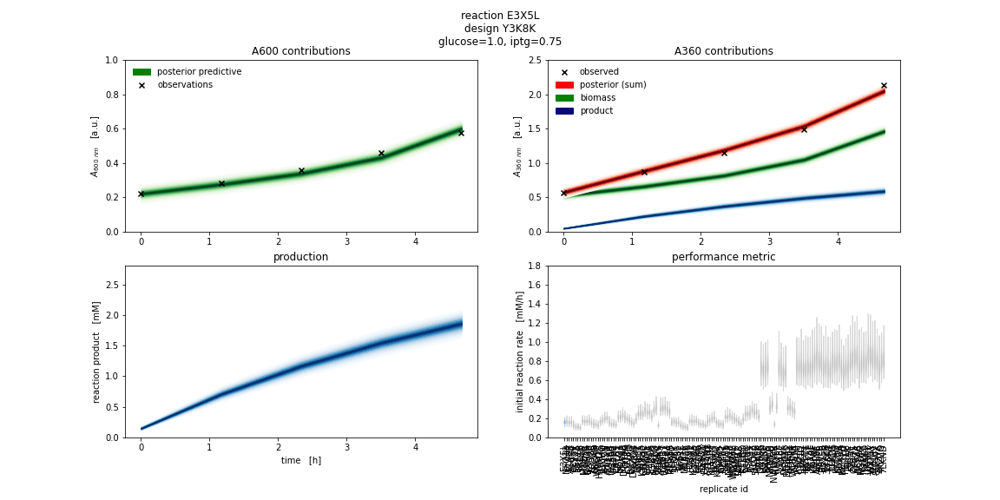

In [9]:
fp_out = plotting.plot_gif(
    fn_plot=fn_plot,
    fp_out="multibatch.gif",
    data=order,
    fps=3
)
Image(fp_out)

In [10]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Sun Oct 10 2021

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.22.0

matplotlib: 3.4.2
ipywidgets: 7.6.3
numpy     : 1.21.0
pandas    : 1.3.0
pymc      : 4.0.0
arviz     : 0.11.2

Watermark: 2.2.0

